# Tensorflow Learning with Tensorflow Part 3: Scaling up (Food Vision mini)

We've seen the power of transfer learning feature extraction and fine-tuning, now it's time to scale up to all of the classes in Food101 (101 total classes of food).

Our goal is to beat the original Food101 paper with 10% of the training (leveraging the power of deep learning)

Our baseline to beat is 50.76% accuracy across 101 classes.

## Creating helper functions 

In [1]:
import tensorflow as tf

In [2]:
def create_tensorboard_callback(dir_name, experiment_name):
    """
    Creates a TensorBoard callback instand to store log files.
    
    Stores log files with the filepath:
    "dir_name/experiment_name/current_datetime/"
    
    Args:
    dir_name: target directory to store TensorBoard log files
    experiment_name: name of experiment directory (e.g. efficientnet_model_1)
    """
    log_dir = dir_name + '/' + experiment_name + '/' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.tensorboard_callback(
        log_dir=log_dir
    )
    print(f'Saving TensorBoard log files to: {log_dir}')
    return tensorboard_callback   

In [3]:
import matplotlib.pyplot as plt 

In [4]:
def plot_loss_curves(history):
    """
    Returns separate loss curves for training and validation metrics.
    
    Args:
    history: TensorFlow model History object (see: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/History)
    """ 

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))

    # Plot loss
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title("Loss")
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.figure()
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title("Accuracy")
    plt.xlabel('Epochs')
    plt.legend()
    

In [5]:
def compare_historys(original_history, new_history, initial_epochs=5):
    """
    Compares two TensorFlow model History objects.
    
    Args:
      original_history: History object from original model (before new_history)
      new_history: History object from continued model training (after original_history)
      initial_epochs: Number of epochs in original_history (new_history plot starts from here) 
    """
    
    # Get original history measurements
    acc = original_history.history["accuracy"]
    loss = original_history.history["loss"]

    val_acc = original_history.history["val_accuracy"]
    val_loss = original_history.history["val_loss"]

    # Combine original history with new history
    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    # Make plots
    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()
  

In [7]:
import zipfile

def unzip_data(filename):
    """
    Unzips filename into the current working directory.
    
    Args:
    filename (str): a filepath to a target zip folder to be unzipped.
    """
    zip_ref = zipfile.ZipFile(filename, "r")
    zip_ref.extractall()
    zip_ref.close()


In [9]:
import os

def walk_through_dir(dir_path):
    """
    Walks through dir_path returning its contents.
    
    Args:
    dir_path (str): target directory
    
    Returns:
    A print out of:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
    """
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

## 101 Food classes: Working with less data

Our goal is to beat the original Food101 paper with 10% of the training data, so let's download it.

The data we're downloading comes from the original Food101 dataset but has been preprocessed.

In [10]:
import wget

In [11]:
wget.download('https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip')

100% [....................................................................] 1625420029 / 1625420029

'101_food_classes_10_percent.zip'

In [12]:
unzip_data('101_food_classes_10_percent.zip')

In [13]:
train_dir = '101_food_classes_10_percent/train/'
test_dir = '101_food_classes_10_percent/test/'


In [15]:
# How many images/classes are there? 
walk_through_dir('101_food_classes_10_percent')

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent\test'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\apple_pie'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baby_back_ribs'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baklava'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_carpaccio'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_tartare'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beet_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beignets'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bibimbap'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bread_pudding'.
There are 0 directories and 250 images in '10

In [16]:
# Setup data inputs 
import tensorflow as tf 
IMG_SIZE = (224, 224)
train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(
    directory=train_dir,
    label_mode='categorical',
    image_size=IMG_SIZE
)

test_data = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    label_mode='categorical',
    image_size=IMG_SIZE,
    shuffle=False # don't shuffle test data for prediction analysis
)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


## Train a big dog model with transfer learning on 10% of 101 food classes

Here are the steps we're going to take: 
* Create a ModelCheckpoint callback
* Create a data augmentation layer to build layer augmentation right into the model.
* Build a headless (no top layers) Functional EfficientNetB0 backboned-model (we'll create our own output layer)
* Compile our model
* Feature extract for 5 full passes (5 epochs on trained dataset and validate on 15% of test data to save epoch time)

In [19]:
# Create checkpoint callback
checkpoint_path = '101_classes_10_percent_data_model_checkpoint.weights.h5'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_path,
    save_weights_only=True,
    monitor='val_accuracy',
    save_best_only=True # only keep the best model weights on file (delete the rest)
)

In [20]:
# Create data augmentation layer to incorporate it right into the model 
from tensorflow.keras import layers 
from tensorflow.keras.models import Sequential

data_augmentation = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    # layers.Rescaling(1./255) # keep for ResNet50V2, remove for EfficientNetB0
], name='data_augmentation')

In [23]:
# Setup base model and freeze its layers (this will extract features)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layers
inputs = layers.Input(shape=(224, 224, 3), name="input_layer") # shape of input image
x = data_augmentation(inputs) # augment images (only happens during training)
x = base_model(x, training=False) # put the base model in inference mode so we can use it to extract features without updating the weights
x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x) # pool the outputs of the base model
outputs = layers.Dense(len(train_data_all_10_percent.class_names), activation="softmax", name="output_layer")(x) # same number of outputs as classes
model = tf.keras.Model(inputs, outputs)

In [24]:
# Get a summary of our model 
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, None, None, 1280)    │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling               │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 101)                 │         129,381 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,048,693 (23.07 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [25]:
# Compile 
model.compile(loss='categorical_crossentropy',
             optimizer=tf.keras.optimizers.Adam(),
             metrics=['accuracy'])

# Fit 
history_all_classes_10_percent = model.fit(
    train_data_all_10_percent,
    epochs=5,
    validation_data=test_data,
    validation_steps=int(0.15 * len(test_data)),
    callbacks=[checkpoint_callback]
)

Epoch 1/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 169s 665ms/step - accuracy: 0.2235 - loss: 3.5815 - val_accuracy: 0.4208 - val_loss: 2.7011
Epoch 2/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 159s 673ms/step - accuracy: 0.4186 - loss: 2.5200 - val_accuracy: 0.4711 - val_loss: 2.2352
Epoch 3/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 280s 1s/step - accuracy: 0.4878 - loss: 2.1564 - val_accuracy: 0.5167 - val_loss: 1.9912
Epoch 4/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 177s 747ms/step - accuracy: 0.5263 - loss: 1.9449 - val_accuracy: 0.5167 - val_loss: 1.9048
Epoch 5/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 188s 793ms/step - accuracy: 0.5464 - loss: 1.8147 - val_accuracy: 0.5265 - val_loss: 1.8415


In [26]:
# Evaluate model 
results_feature_extraction_model = model.evaluate(test_data)
results_feature_extraction_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 388s 491ms/step - accuracy: 0.5671 - loss: 1.6466


[1.646612524986267, 0.5670890808105469]

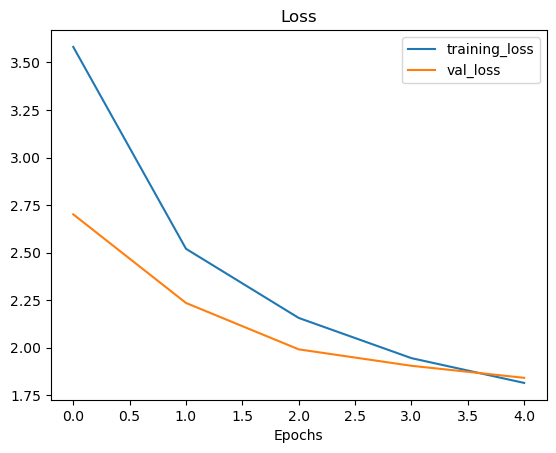

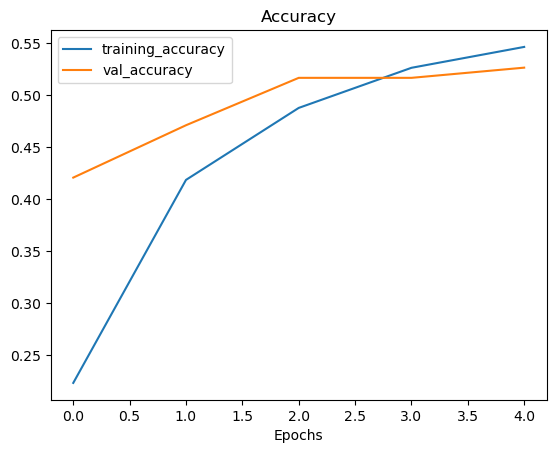

In [27]:
# plot loss curves 
plot_loss_curves(history_all_classes_10_percent)

## Fine-Tuning

Our feature extraction transfer learning model is performing well. Why don't we try to fine-tune a few layers in the base model and see if we gain any improvements?

The good news is, thanks to the ModelCheckpoint callback, we've got the saved weights of our already well-performing model so if fine-tuning doesn't add any benefits, we can revert back.

To fine-tune the base model we'll first set its trainable attribute to True, unfreezing all of the frozen.

Then since we've got a relatively small training dataset, we'll refreeze every layer except for the last 5, making them trainable.

In [28]:
# Unfreeze all of the layers in the base model 
base_model.trainable = True 

# Refreeze every layer except for the last five 
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [30]:
for layer_number, layer in enumerate(base_model.layers):
    print(layer_number , '|', layer.name, '|', layer.trainable)

0 | input_layer_2 | False
1 | rescaling_4 | False
2 | normalization_2 | False
3 | stem_conv | False
4 | stem_bn | False
5 | stem_activation | False
6 | block1a_project_conv | False
7 | block1a_project_bn | False
8 | block1a_project_activation | False
9 | block2a_expand_conv | False
10 | block2a_expand_bn | False
11 | block2a_expand_activation | False
12 | block2a_project_conv | False
13 | block2a_project_bn | False
14 | block2b_expand_conv | False
15 | block2b_expand_bn | False
16 | block2b_expand_activation | False
17 | block2b_project_conv | False
18 | block2b_project_bn | False
19 | block2b_drop | False
20 | block2b_add | False
21 | block3a_expand_conv | False
22 | block3a_expand_bn | False
23 | block3a_expand_activation | False
24 | block3a_project_conv | False
25 | block3a_project_bn | False
26 | block3b_expand_conv | False
27 | block3b_expand_bn | False
28 | block3b_expand_activation | False
29 | block3b_project_conv | False
30 | block3b_project_bn | False
31 | block3b_drop | Fal

When fine-tuning and unfreezing layers of your pre-trained model, it's common practice to lower the learning rate you used for your feature extraction model. How much by? A 10x lower learning rate is usually a good place to to start

In [31]:
# Recompile model with lowe learning rate 
model.compile(loss='categorical_crossentropy',
             optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])

Time to fine-tune our model.

Another 5 epochs should be enough to see whether any benefits come about (though we could always try more).

We'll start the training off where the feature extraction model left off using the initial_epoch parameter in the fit() function.

In [32]:
# Fine tune for 5 more epochs 
fine_tune_epochs = 10 # model has already done 5 epochs, this is the total number of epochs we're after (5+5=10)

history_all_classes_10_percent_fine_tune = model.fit(train_data_all_10_percent,
                                                    epochs=fine_tune_epochs,
                                                    validation_data=test_data,
                                                    validation_steps=int(0.25 * len(test_data)),
                                                    initial_epoch=history_all_classes_10_percent.epoch[-1])

Epoch 5/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 283s 1s/step - accuracy: 0.5674 - loss: 1.9173 - val_accuracy: 0.5048 - val_loss: 1.9492
Epoch 6/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 272s 1s/step - accuracy: 0.5980 - loss: 1.7511 - val_accuracy: 0.5217 - val_loss: 1.8542
Epoch 7/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 297s 1s/step - accuracy: 0.6091 - loss: 1.6665 - val_accuracy: 0.5330 - val_loss: 1.8017
Epoch 8/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 277s 1s/step - accuracy: 0.6157 - loss: 1.6191 - val_accuracy: 0.5378 - val_loss: 1.7609
Epoch 9/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 271s 1s/step - accuracy: 0.6222 - loss: 1.5590 - val_accuracy: 0.5468 - val_loss: 1.7288
Epoch 10/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 283s 1s/step - accuracy: 0.6400 - loss: 1.5125 - val_accuracy: 0.5500 - val_loss: 1.6997


In [33]:
# Evaluate 
results_all_class_10_percent_fine_tune = model.evaluate(test_data)
results_all_class_10_percent_fine_tune

790/790 ━━━━━━━━━━━━━━━━━━━━ 560s 708ms/step - accuracy: 0.6041 - loss: 1.4848


[1.4847526550292969, 0.604118824005127]

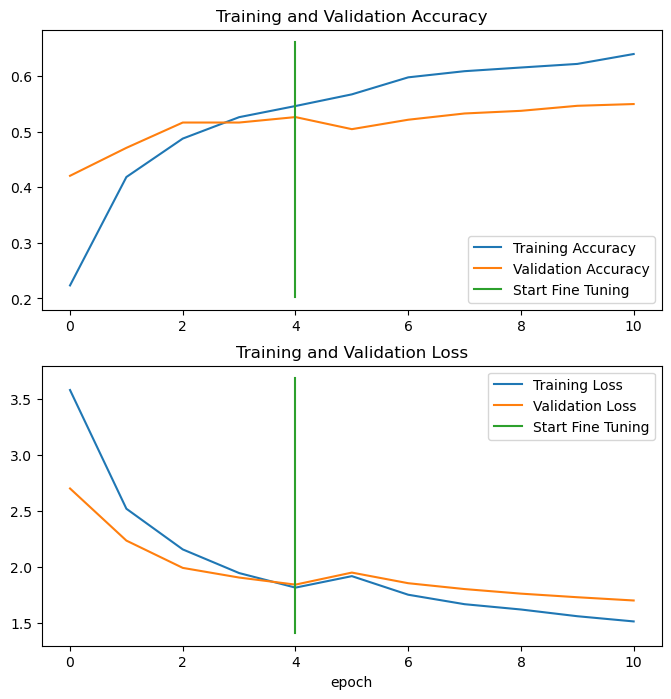

In [35]:
# Compare histories before and after fine tuning
compare_historys(original_history=history_all_classes_10_percent,
               new_history=history_all_classes_10_percent_fine_tune,
               initial_epochs=5)

## Saving our trained model 

To prevent having to retrain our model from scratch, let's save it to file using the save() method.

In [37]:
# Save model 
model.save('models/101_food_classes_10_percent_saved_big_dog_model.h5')

## Evaluating the performance of the big dog model across all different classes

We've got a trained and saved model which according to the evaluation metrics we've used is performing fairly well.

But metrics schmetrics, let's dive a little deeper into our model's performance and get some visualizations going.

To do so, we'll load in the saved model and use it to make some predictions on the test dataset.

In [40]:
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import (
    RandomFlip, RandomRotation, RandomZoom,
    RandomHeight, RandomWidth
)

loaded_model = load_model(
    'models/101_food_classes_10_percent_saved_big_dog_model.h5',
    custom_objects={
        'RandomFlip': RandomFlip,
        'RandomRotation': RandomRotation,
        'RandomZoom': RandomZoom,
        'RandomHeight': RandomHeight,
        'RandomWidth': RandomWidth
    }
)


In [41]:
loaded_loss, loaded_accuracy = model.evaluate(test_data)
loaded_loss, loaded_accuracy

790/790 ━━━━━━━━━━━━━━━━━━━━ 640s 810ms/step - accuracy: 0.6041 - loss: 1.4848 


(1.4847526550292969, 0.604118824005127)

## Making predictions with our trained model

To evaluate our trained model, we need to make some predictions with it and then compare those predictions to the test dataset.

Because the model has never seen the test dataset, this should give us an indication of how the model will perform in the real world on data similar to what it has been trained on.

To make predictions with our trained model, we can use the predict() method passing it the test data.

Since our data is multi-class, doing this will return a prediction probably tensor for each sample.

In other words, every time the trained model see's an image it will compare it to all of the patterns it learned during training and return an output for every class (all 101 of them) of how likely the image is to be that class.

In [42]:
# Make predictions with model 
pred_probs = model.predict(test_data, verbose=1)

790/790 ━━━━━━━━━━━━━━━━━━━━ 581s 729ms/step


In [43]:
pred_probs

array([[7.1278075e-03, 4.5825398e-04, 1.6599756e-01, ..., 2.5997559e-05,
        2.0973801e-03, 7.9643656e-04],
       [3.8519603e-01, 5.1448609e-05, 1.3004482e-02, ..., 3.0735086e-03,
        5.6407844e-05, 1.2426283e-03],
       [1.2149948e-01, 6.5790355e-04, 1.7716352e-02, ..., 8.1609320e-03,
        9.3613169e-04, 2.7944602e-03],
       ...,
       [7.6032762e-04, 3.5686284e-02, 7.3080490e-05, ..., 1.8711400e-03,
        1.4927371e-02, 3.0356385e-02],
       [6.4993678e-03, 3.0140965e-03, 3.8168943e-03, ..., 4.8344815e-03,
        1.1767446e-03, 2.3514701e-01],
       [5.3536491e-03, 1.1366859e-02, 9.3929451e-03, ..., 2.0203842e-02,
        1.9087621e-03, 1.2783669e-01]], dtype=float32)

In [44]:
len(pred_probs)

25250

In [45]:
# what's the shape of our predicts? 
pred_probs.shape

(25250, 101)

In [46]:
pred_probs[:10]

array([[7.1278075e-03, 4.5825398e-04, 1.6599756e-01, ..., 2.5997559e-05,
        2.0973801e-03, 7.9643656e-04],
       [3.8519603e-01, 5.1448609e-05, 1.3004482e-02, ..., 3.0735086e-03,
        5.6407844e-05, 1.2426283e-03],
       [1.2149948e-01, 6.5790355e-04, 1.7716352e-02, ..., 8.1609320e-03,
        9.3613169e-04, 2.7944602e-03],
       ...,
       [1.4292127e-01, 5.2164080e-05, 3.5265114e-02, ..., 1.9839949e-03,
        8.5140736e-04, 1.3272713e-03],
       [8.1065506e-02, 5.0530303e-04, 1.0744334e-01, ..., 7.6632146e-03,
        3.7124791e-04, 1.1962460e-03],
       [2.0694418e-01, 4.7529342e-05, 1.2693115e-02, ..., 9.6425805e-03,
        6.0461400e-05, 1.2275965e-03]], dtype=float32)

In [47]:
# We get one prediction probability per class 
print(f'Number of prediction probabilities for sample 0: {len(pred_probs[0])}')
print(f'What prediction probability sample 0 looks like:\n {pred_probs[0]}')
print(f'The class with the highest predicted probability by the model for sample 0: {pred_probs[0].argmax()}')


Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looks like:
 [7.12780748e-03 4.58253984e-04 1.65997565e-01 2.16760363e-05
 5.68225048e-04 1.06455514e-03 3.19119048e-04 1.92649153e-04
 1.82791869e-03 5.32656908e-03 1.47995263e-04 2.19596855e-04
 1.14574190e-03 1.75729176e-04 1.75930578e-02 3.29534039e-02
 3.19753028e-03 1.71894988e-03 5.87867619e-03 4.62303078e-03
 5.86032728e-03 1.56742200e-04 7.49584753e-04 2.55995168e-04
 1.32814120e-03 1.41559420e-02 3.78840230e-03 1.20085155e-04
 7.30352104e-03 5.91154851e-04 4.61521558e-05 4.39623254e-04
 1.16788102e-02 1.46270986e-03 1.47597091e-02 2.87343282e-04
 3.69664235e-03 4.88611264e-03 1.51443556e-02 8.00213602e-04
 1.73202774e-03 3.16282688e-03 3.23706830e-04 1.11063209e-03
 6.76154799e-04 7.66541867e-04 1.40733714e-03 5.57338470e-04
 1.71618164e-03 1.40678911e-02 1.60225353e-03 2.58299755e-03
 3.29987891e-02 3.46459076e-02 1.38389543e-04 7.16609415e-03
 4.31061164e-03 4.33625560e-03 1.07576828e-

In [48]:
# Get the class predictions of each label 
pred_classes = pred_probs.argmax(axis=1)

# How do they look? 
pred_classes[:10]

array([85,  0,  0,  0,  8, 78, 29, 46,  9, 41], dtype=int64)

In [51]:
y_labels = []
for images, labels in test_data.unbatch():
    y_labels.append(labels.numpy().argmax())
y_labels[:10]
    

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [52]:
# How many labels are there? (should be the same as how many pred probs we got)
len(y_labels)

25250

## Evaluating our models predictions 

A very simple evaluation is to use scikit-learn accuracy_score() function which compares truth labels to predicted labels and returns an accuracy score 

if we've created our y_labels and pred_classes array correctly, this should return the same accuracy value (or at least very close) as the evaluate() method we used earlier.

In [54]:
# Get accuracy score by comparing predicted classes to ground truth labels 
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_labels, pred_classes)
sklearn_accuracy

0.6041188118811881

In [56]:
import numpy as np
print(f"Close? {np.isclose(loaded_accuracy, sklearn_accuracy)} | Difference: {loaded_accuracy - sklearn_accuracy}")


Close? True | Difference: 1.212393885285934e-08


In [57]:
from helper_functions import make_confusion_matrix

In [60]:
import itertools 
import matplotlib.pyplot as plt 
import numpy as np 
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    """Makes a labelled confusion matrix comparing predictions and ground truth labels.
    
    If classes is passed, confusion matrix will be labelled, if not, integer class values
    will be used.
    
    Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
    
    Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.
    
    Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
    """  
    # Create the confustion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with
    
    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)
    
    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])
    
    # Label the axes
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
    
    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    
    ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)
    
    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.
    
    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
          plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                  horizontalalignment="center",
                  color="white" if cm[i, j] > threshold else "black",
                  size=text_size)
        else:
          plt.text(j, i, f"{cm[i, j]}",
                  horizontalalignment="center",
                  color="white" if cm[i, j] > threshold else "black",
                  size=text_size)
    
    # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

In [61]:
# Get the class names 
class_names = test_data.class_names 
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [62]:
make_confusion_matrix(y_labels,
                     pred_classes,
                     class_names,
                     (100, 100),
                     text_size=20,
                     norm=False,
                     savefig=False)

In [63]:
from sklearn.metrics import classification_report
print(classification_report(y_labels, pred_classes))

              precision    recall  f1-score   support

           0       0.44      0.14      0.21       250
           1       0.62      0.69      0.65       250
           2       0.70      0.58      0.63       250
           3       0.69      0.54      0.61       250
           4       0.59      0.41      0.48       250
           5       0.55      0.43      0.48       250
           6       0.71      0.77      0.74       250
           7       0.83      0.74      0.79       250
           8       0.28      0.58      0.37       250
           9       0.34      0.76      0.47       250
          10       0.56      0.45      0.50       250
          11       0.58      0.60      0.59       250
          12       0.76      0.56      0.64       250
          13       0.59      0.55      0.57       250
          14       0.51      0.60      0.55       250
          15       0.43      0.30      0.35       250
          16       0.66      0.52      0.58       250
          17       0.47    

In [64]:
# Get a dictionary of the classification report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.4375,
  'recall': 0.14,
  'f1-score': 0.21212121212121213,
  'support': 250.0},
 '1': {'precision': 0.6231884057971014,
  'recall': 0.688,
  'f1-score': 0.6539923954372624,
  'support': 250.0},
 '2': {'precision': 0.6990291262135923,
  'recall': 0.576,
  'f1-score': 0.631578947368421,
  'support': 250.0},
 '3': {'precision': 0.6887755102040817,
  'recall': 0.54,
  'f1-score': 0.6053811659192825,
  'support': 250.0},
 '4': {'precision': 0.5895953757225434,
  'recall': 0.408,
  'f1-score': 0.48226950354609927,
  'support': 250.0},
 '5': {'precision': 0.5544041450777202,
  'recall': 0.428,
  'f1-score': 0.48306997742663654,
  'support': 250.0},
 '6': {'precision': 0.706959706959707,
  'recall': 0.772,
  'f1-score': 0.7380497131931166,
  'support': 250.0},
 '7': {'precision': 0.8340807174887892,
  'recall': 0.744,
  'f1-score': 0.7864693446088795,
  'support': 250.0},
 '8': {'precision': 0.27514231499051234,
  'recall': 0.58,
  'f1-score': 0.3732303732303732,
  'suppo

Alright, there's still a fair few values here, how about we narrow down?

Since the f1-score combines precision and recall in one metric, let's focus on that.

To extract it, we'll create an empty dictionary called class_f1_scores and then loop through each item in classification_report_dict, appending the class name and f1-score as the key, value pairs in class_f1_scores.

In [65]:
# Create empty dictionary
class_f1_scores = {}
# Loop through classification report items 
for k, v in classification_report_dict.items():
    if k == 'accuracy':
        break
    else:
        class_f1_scores[class_names[int(k)]] = v['f1-score']
class_f1_scores

{'apple_pie': 0.21212121212121213,
 'baby_back_ribs': 0.6539923954372624,
 'baklava': 0.631578947368421,
 'beef_carpaccio': 0.6053811659192825,
 'beef_tartare': 0.48226950354609927,
 'beet_salad': 0.48306997742663654,
 'beignets': 0.7380497131931166,
 'bibimbap': 0.7864693446088795,
 'bread_pudding': 0.3732303732303732,
 'breakfast_burrito': 0.47102342786683105,
 'bruschetta': 0.4988962472406181,
 'caesar_salad': 0.593320235756385,
 'cannoli': 0.6405529953917051,
 'caprese_salad': 0.567287784679089,
 'carrot_cake': 0.5484460694698354,
 'ceviche': 0.34988179669030733,
 'cheese_plate': 0.5803571428571429,
 'cheesecake': 0.415929203539823,
 'chicken_curry': 0.4860215053763441,
 'chicken_quesadilla': 0.5770750988142292,
 'chicken_wings': 0.6964618249534451,
 'chocolate_cake': 0.5864978902953587,
 'chocolate_mousse': 0.4,
 'churros': 0.744920993227991,
 'clam_chowder': 0.722753346080306,
 'club_sandwich': 0.6180555555555556,
 'crab_cakes': 0.42934782608695654,
 'creme_brulee': 0.70762711864

It seems like our dictionary is ordered by the class names. However, I think if we're trying to visualize different scores, it might look nicer if they were in some kind of order.

How about we turn our class_f1_scores dictionary into a pandas DataFrame and sort it in ascending fashion?

In [66]:
# Turn f1-scores into dataframe for visualization
import pandas as pd
f1_scores = pd.DataFrame({"class_name": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores.head()

,class_name,f1-score
33,edamame,0.955340
63,macarons,0.874172
86,sashimi,0.847737
54,hot_and_sour_soup,0.840304
45,frozen_yogurt,0.837675


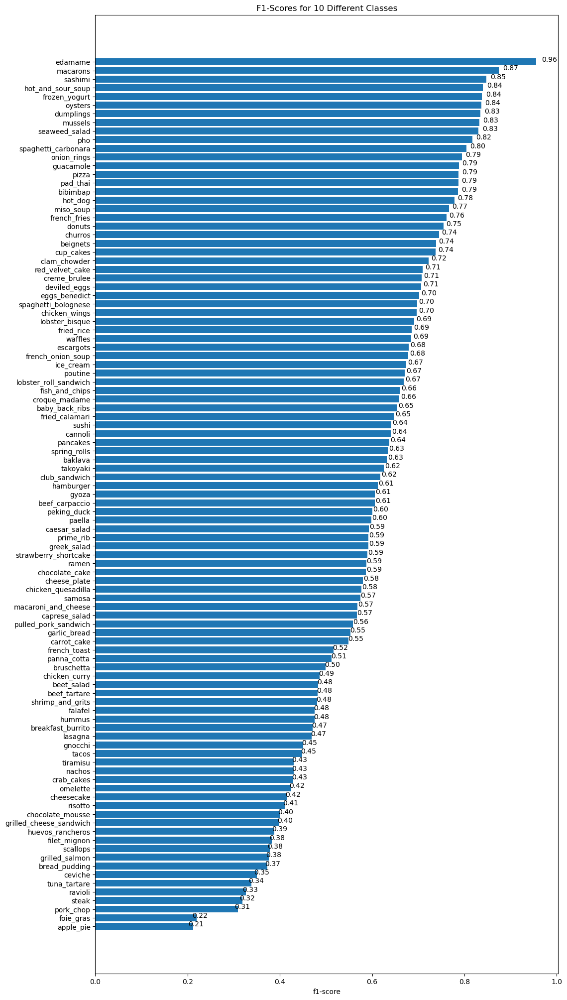

In [72]:
import matplotlib.pyplot as plt 

fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores['f1-score'].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(list(f1_scores["class_name"]))
ax.set_xlabel("f1-score")
ax.set_title("F1-Scores for 10 Different Classes")
ax.invert_yaxis(); # reverse the order

def autolabel(rects): # Modified version of: https://matplotlib.org/examples/api/barchart_demo.html
  """
  Attach a text label above each bar displaying its height (it's value).
  """
  for rect in rects:
    width = rect.get_width()
    ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
            f"{width:.2f}",
            ha='center', va='bottom')

autolabel(scores)


Now that's a good looking graph! I mean, the text positioning could be improved a little but it'll do for now.

Can you see how visualizing our model's predictions gives us a completely new insight into its performance?

A few moments ago we only had an accuracy score but now we've got an indiciation of how well our model is performing on a class by class basis.

It seems like our model performs fairly poorly on classes like apple_pie and ravioli while for classes like edamame and pho the performance is quite outstanding.

Findings like these give us clues into where we could go next with our experiments. Perhaps we may have to collect more data on poor performing classes or perhaps the worst performing classes are just hard to make predictions on.

### Exercise: Visualize some of the most poor performing classes, do you notice any trends among them?

In [73]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_random_images_for_class(class_label, base_dir='101_food_classes_10_percent/test', num_images=16):
    """
    Displays a grid of random images from the specified class in the test dataset.

    Parameters:
        class_label (str): The name of the class folder to inspect (e.g., "pizza").
        base_dir (str): Path to the test directory.
        num_images (int): Total number of images to display.
    """
    class_path = os.path.join(base_dir, class_label)
    
    # Check if the class exists
    if not os.path.exists(class_path):
        print(f"Class '{class_label}' not found in {base_dir}. Please check the class name.")
        return

    # Get all image file paths for that class
    image_files = os.listdir(class_path)
    if len(image_files) == 0:
        print(f"No images found in class '{class_label}'")
        return

    # Randomly pick images
    random_images = random.sample(image_files, min(num_images, len(image_files)))

    # Setup figure
    plt.figure(figsize=(12, 12))
    plt.suptitle(f"Random {len(random_images)} images from class: '{class_label}'", fontsize=14, fontweight='bold')

    # Plot each image in a 4x4 grid
    for i, img_name in enumerate(random_images):
        img_path = os.path.join(class_path, img_name)
        img = mpimg.imread(img_path)

        plt.subplot(4, 4, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{class_label}", fontsize=9)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


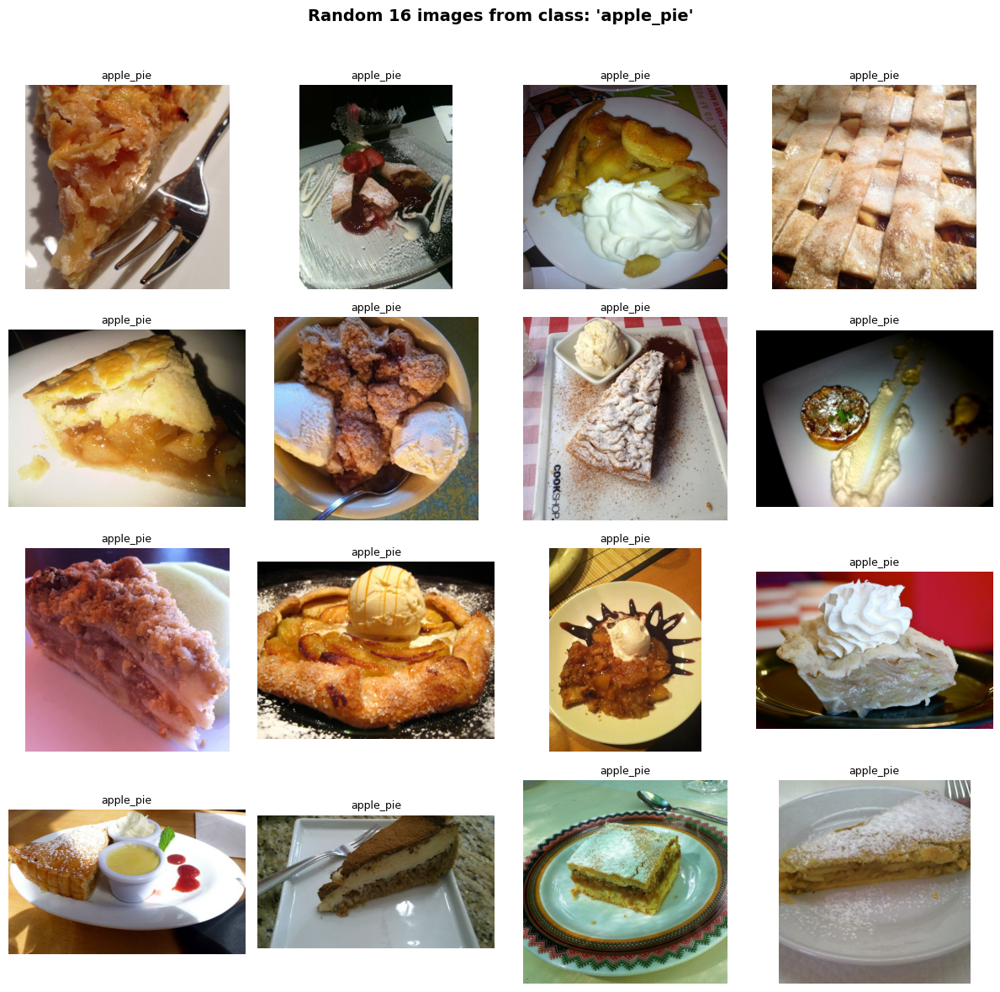

In [75]:
plot_random_images_for_class(class_label='apple_pie')

**Ahhh in each image apple pie looks different maybe let's check the top performing class to make sure we are thinking in the right direction.**

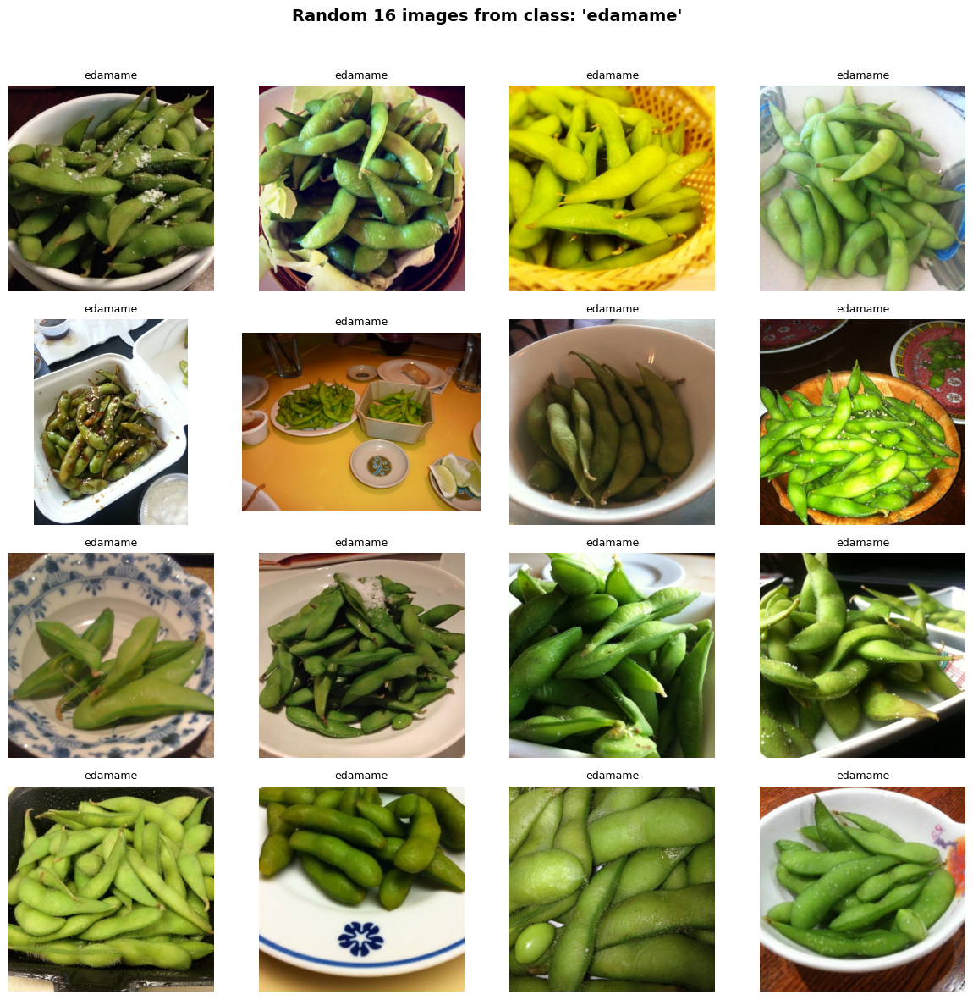

In [76]:
plot_random_images_for_class(class_label='edamame')

**Yes all looks exactly similar no confusion at all.**

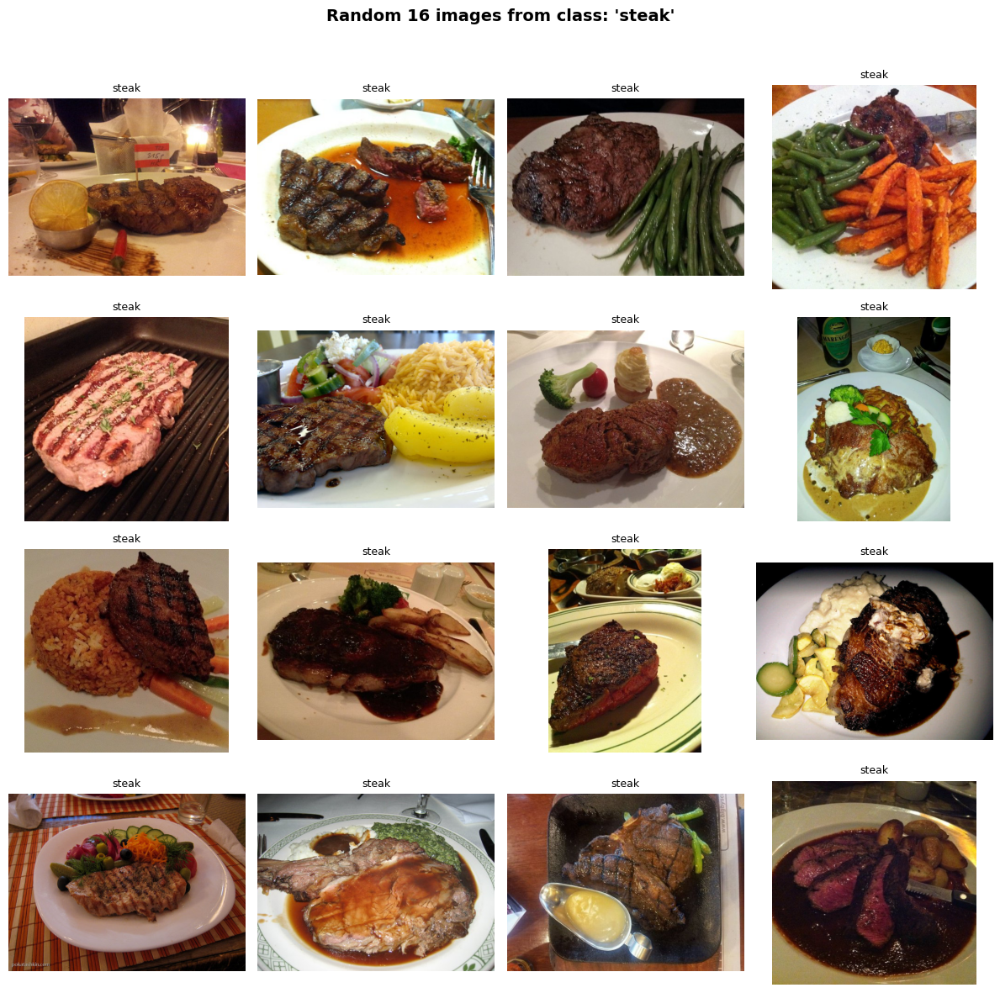

In [77]:
plot_random_images_for_class(class_label='steak')

**I observe the confusion matrix and find out for which food object the model is confused with steak and these are 3 of them baby_back_ribs, filet_mignon, prime_rib let's see if that's true**

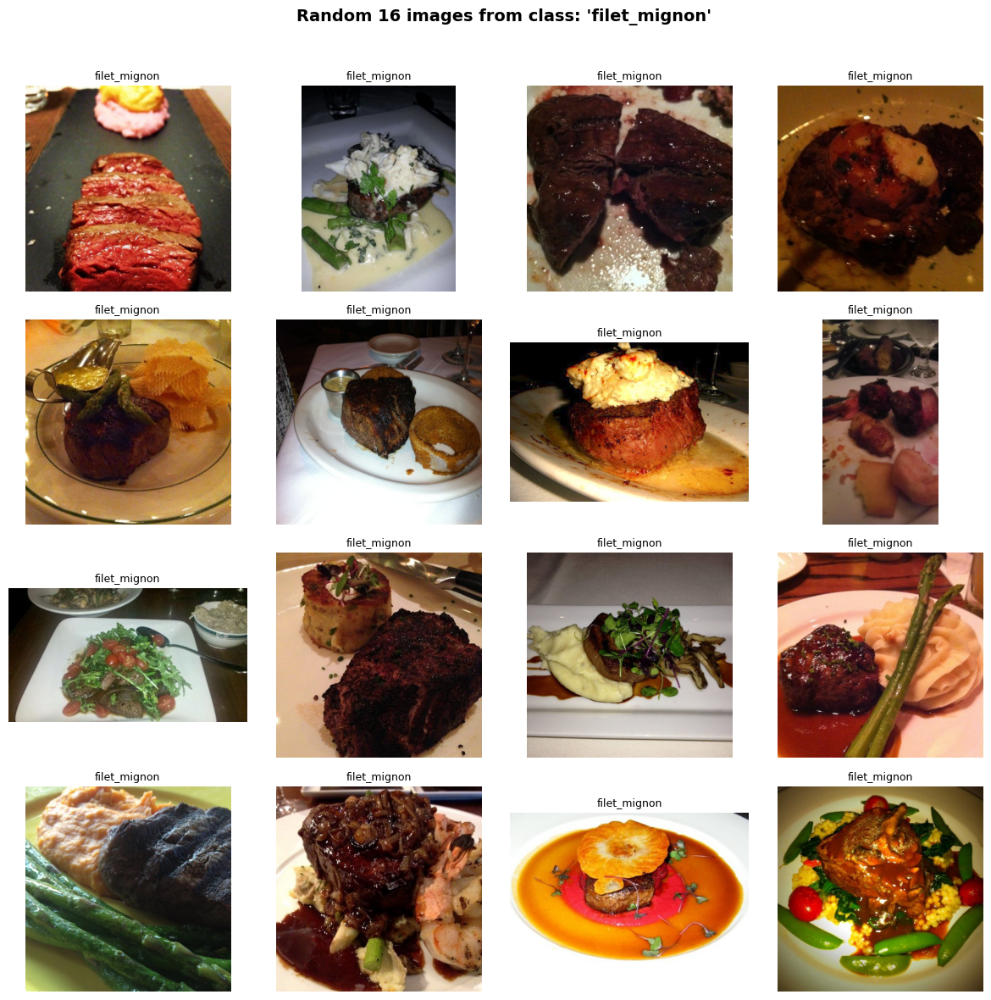

In [78]:
plot_random_images_for_class(class_label='filet_mignon')

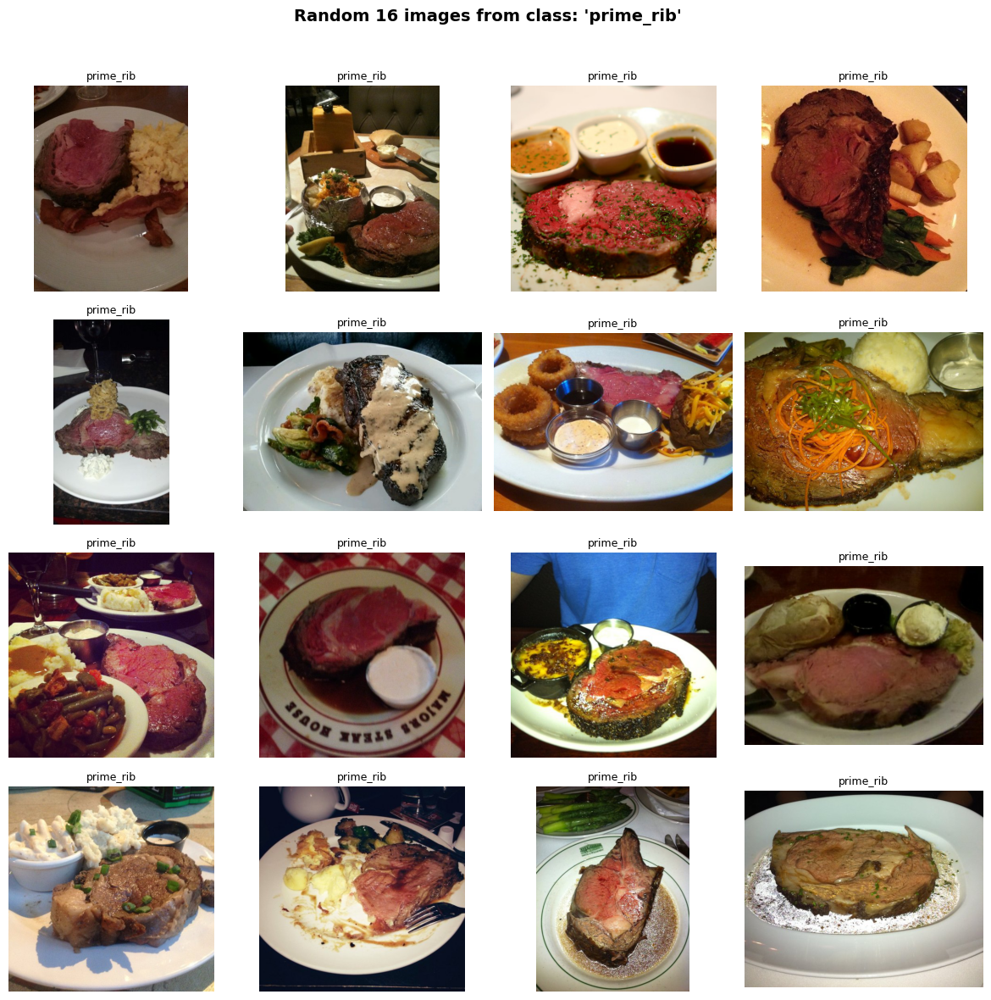

In [79]:
plot_random_images_for_class(class_label='prime_rib')

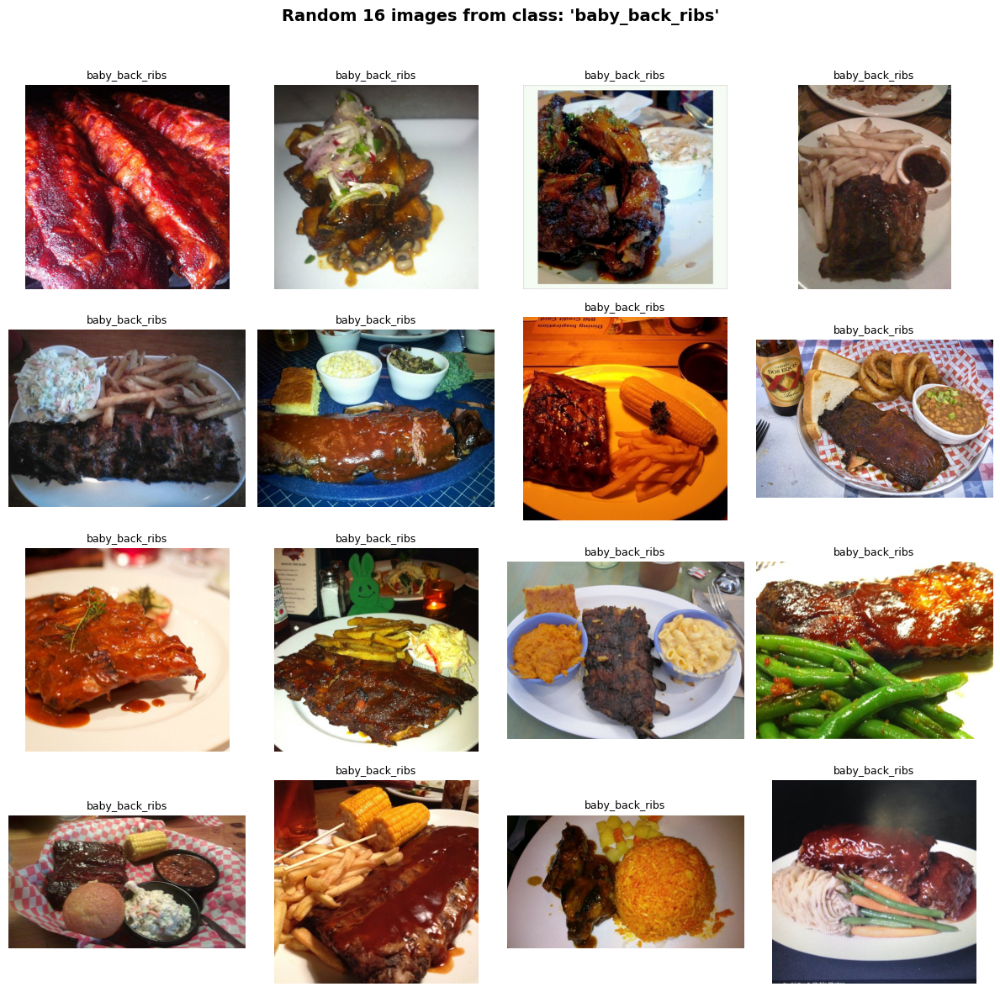

In [80]:
plot_random_images_for_class(class_label='baby_back_ribs')

**They are all look very similar to steak that's why model is confused**

## Visualizing predictions on test images
Time for the real test. Visualizing predictions on actual images. You can look at all the metrics you want but until you've visualized some predictions, you won't really know how your model is performing.

As it stands, our model can't just predict on any image of our choice. The image first has to be loaded into a tensor.

So to begin predicting on any given image, we'll create a function to load an image into a tensor.

Specifically, it'll:

* Read in a target image filepath using tf.io.read_file().
* Turn the image into a Tensor using tf.io.decode_image().
* Resize the image to be the same size as the images our model has been trained on (224 x 224) using tf.image.resize().
* Scale the image to get all the pixel values between 0 & 1 if necessary.

In [81]:
def load_and_prep_image(filename, img_shape=224, scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  (224, 224, 3).

  Parameters
  ----------
  filename (str): string filename of target image
  img_shape (int): size to resize target image to, default 224
  scale (bool): whether to scale pixel values to range(0, 1), default True
  """
  # Read in the image
  img = tf.io.read_file(filename)
  # Decode it into a tensor
  img = tf.io.decode_image(img)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  if scale:
    # Rescale the image (get all values between 0 and 1)
    return img/255.
  else:
    return img

Image loading and preprocessing function ready.

Now let's write some code to:

1. Load a few random images from the test dataset.
2. Make predictions on them.
3. Plot the original image(s) along with the model's predicted label, prediction probability and ground truth label.

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


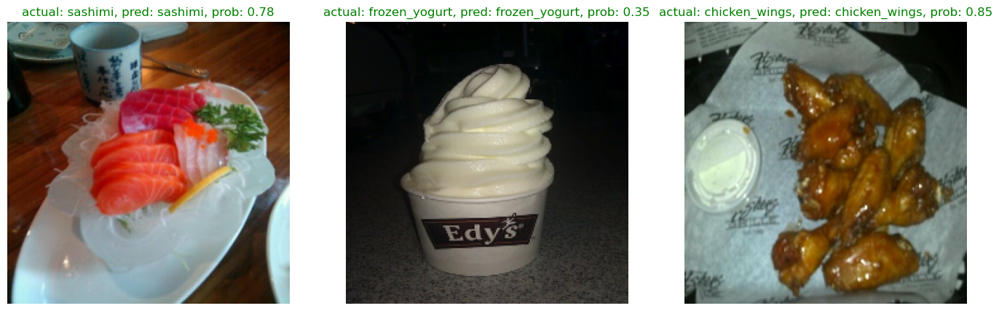

In [82]:
# Make preds on a series of random images
import os
import random

plt.figure(figsize=(17, 10))
for i in range(3):
  # Choose a random image from a random class 
  class_name = random.choice(class_names)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir + class_name + "/" + filename

  # Load the image and make predictions
  img = load_and_prep_image(filepath, scale=False) # don't scale images for EfficientNet predictions
  pred_prob = model.predict(tf.expand_dims(img, axis=0)) # model accepts tensors of shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] # find the predicted class 

  # Plot the image(s)
  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class: # Change the color of text based on whether prediction is right or wrong
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);


After going through enough random samples, it starts to become clear that the model tends to make far worse predictions on classes which are visually similar such as baby_back_ribs getting mistaken as steak and vice versa.

## Finding the most wrong predictions
It's a good idea to go through at least 100+ random instances of your model's predictions to get a good feel for how it's doing.

After a while you might notice the model predicting on some images with a very high prediction probability, meaning it's very confident with its prediction but still getting the label wrong.

These most wrong predictions can help to give further insight into your model's performance.

So how about we write some code to collect all of the predictions where the model has output a high prediction probability for an image (e.g. 0.95+) but gotten the prediction wrong.

We'll go through the following steps:

* Get all of the image file paths in the test dataset using the list_files() method.
* Create a pandas DataFrame of the image filepaths, ground truth labels, prediction classes, max prediction probabilities, ground truth class names and predicted class names.
* Note: We don't necessarily have to create a DataFrame like this but it'll help us visualize things as we go.
* Use our DataFrame to find all the wrong predictions (where the ground truth doesn't match the prediction).
* Sort the DataFrame based on wrong predictions and highest max prediction probabilities.
Visualize the images with the highest prediction probabilities but have the wrong prediction

In [83]:
# 1. Get the filenames of all our test data 
filepaths = []
for filepath in test_data.list_files('101_food_classes_10_percent/test/*/*.jpg', shuffle=False):
    filepaths.append(filepath.numpy())
filepaths[:10]

[b'101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\101251.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1034399.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\103801.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1038694.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1047447.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1068632.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\110043.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1106961.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1113017.jpg']

### Now we've got all of the test image filepaths, let's combine them into a DataFrame along with:

* Their ground truth labels (y_labels).
* The class the model predicted (pred_classes).
* The maximum prediction probabilitity value (pred_probs.max(axis=1)).
* The ground truth class names.
* The predicted class names.

In [84]:
# 2. Create a dataframe out of current prediction data for analysis
import pandas as pd
pred_df = pd.DataFrame({"img_path": filepaths,
                        "y_true": y_labels,
                        "y_pred": pred_classes,
                        "pred_conf": pred_probs.max(axis=1), # get the maximum prediction probability value
                        "y_true_classname": [class_names[i] for i in y_labels],
                        "y_pred_classname": [class_names[i] for i in pred_classes]}) 

pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,85,0.316731,apple_pie,samosa
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.385196,apple_pie,apple_pie
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.121499,apple_pie,apple_pie
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.230869,apple_pie,apple_pie
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,8,0.776857,apple_pie,bread_pudding


In [85]:
# 3. Is the prediction correct?
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,85,0.316731,apple_pie,samosa,False
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.385196,apple_pie,apple_pie,True
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.121499,apple_pie,apple_pie,True
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.230869,apple_pie,apple_pie,True
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,8,0.776857,apple_pie,bread_pudding,False



And now since we know which predictions were right or wrong and along with their prediction probabilities, how about we get the 100 "most wrong" predictions by sorting for wrong predictions and descending prediction probabilties?

In [86]:
# 4. Get the top 100 wrong examples
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
5114,b'101_food_classes_10_percent\\test\\chicken_w...,20,38,0.988738,chicken_wings,fish_and_chips,False
9690,b'101_food_classes_10_percent\\test\\fish_and_...,38,20,0.984313,fish_and_chips,chicken_wings,False
18541,b'101_food_classes_10_percent\\test\\peking_du...,74,85,0.981145,peking_duck,samosa,False
18001,b'101_food_classes_10_percent\\test\\pancakes\...,72,67,0.980779,pancakes,omelette,False
23797,b'101_food_classes_10_percent\\test\\sushi\\16...,95,86,0.975288,sushi,sashimi,False
4836,b'101_food_classes_10_percent\\test\\chicken_q...,19,9,0.974883,chicken_quesadilla,breakfast_burrito,False
14482,b'101_food_classes_10_percent\\test\\hummus\\8...,57,51,0.974110,hummus,guacamole,False
14062,b'101_food_classes_10_percent\\test\\huevos_ra...,56,28,0.968483,huevos_rancheros,croque_madame,False
18344,b'101_food_classes_10_percent\\test\\panna_cot...,73,60,0.967897,panna_cotta,lobster_bisque,False
8971,b'101_food_classes_10_percent\\test\\escargots...,35,41,0.965866,escargots,french_onion_soup,False


very interesting... just by comparing the ground truth classname (y_true_classname) and the prediction classname column (y_pred_classname), do you notice any trends?

It might be easier if we visualize them.

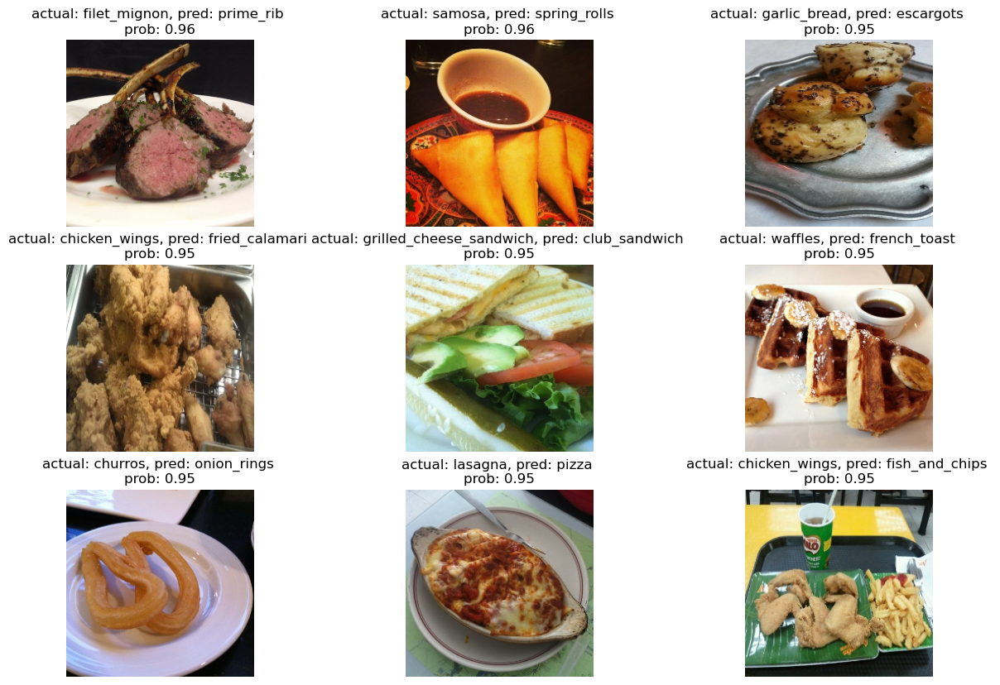

In [87]:
# 5. Visualize some of the most wrong examples
images_to_view = 9
start_index = 10 # change the start index to view more
plt.figure(figsize=(15, 10))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()): 
  plt.subplot(3, 3, i+1)
  img = load_and_prep_image(row[1], scale=True)
  _, _, _, _, pred_prob, y_true, y_pred, _ = row # only interested in a few parameters of each row
  plt.imshow(img)
  plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
  plt.axis(False)

Going through the model's most wrong predictions can usually help figure out a couple of things:

* **Some of the labels might be wrong** - If our model ends up being good enough, it may actually learning to predict very well on certain classes. This means some images which the model predicts the right label may show up as wrong if the ground truth label is wrong. If this is the case, we can often use our model to help us improve the labels in our dataset(s) and in turn, potentially making future models better. This process of using the model to help improve labels is often referred to as active learning.
* **Could more samples be collected?** - If there's a recurring pattern for a certain class being poorly predicted on, perhaps it's a good idea to collect more samples of that particular class in different scenarios to improve further models.